# Cat and dog classifier model with MobileNet

This work is constructured to utilising pre-trained VGG16 and ResNet50 models to classify cats and dogs, and deploying it online for use.

# 1. Notebook Setup

## 1.1 Libraries

In [1]:
# !pip install mlflow
# !pip install bing_image_downloader
# !pip install pydot
# !pip install graphviz
# !pip install -U tensorboard-plugin-profile

In [1]:
import os
import requests

import keras
import mlflow
import mlflow.keras
import mlflow.pyfunc

from bing_image_downloader import downloader

import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from PIL import Image
import imghdr
from pathlib import Path
import random
import shutil

from datetime import datetime

import matplotlib.pyplot as plt
import numpy as np

## 1.2 Define Global Constants

### 1.2.1 Global Constants for model and ImageDataGenerator

In [2]:
num_classes = 2

image_resize = 224

batch_size_training = 64
batch_size_validation = 64

batch_size = batch_size_training
input_shape = (image_resize, image_resize, 3)

num_epochs = 30
patience = 15

learning_rate = 0.01

### 1.2.2 Global Constants for splitting the dataset

In [3]:
train_percent = 0.80
val_percent = 0.20

### 1.2.3 Global Constants for Bing Image Downloader, TensorBoard and MLflow Logging

In [4]:
num_images = 200

class_1 = "cat"
class_2 = "dog"

experiment_name = f"{class_1}_{class_2}_classification_mobilenet"
run_name = datetime.now().strftime("%Y%m%d_%H%M%S")
print(experiment_name, run_name)

cat_dog_classification_mobilenet 20240409_154620


# 2. Download Images and Create a Dataset

## 2.1 Download the images

### 2.1.1 Create an image path

In [5]:
current_directory = os.getcwd()
image_path = os.path.join(current_directory, "{}s_and_{}s".format(class_1, class_2))
print(image_path)

c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs


### 2.1.2 Delete if any images exist (optional)

In [6]:
def delete_path(path):
    try:
        shutil.rmtree(path)
        print("Directory has been deleted successfully")
    except:
        print("Error:", "The system cannot find the path specified.")

delete_path(image_path)

Directory has been deleted successfully


### 2.1.3 Download the images

In [7]:
def download_images(query, limit, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    downloader.download(query,
                        limit=limit,
                        output_dir=output_dir,
                        adult_filter_off=True,
                        force_replace=False,
                        timeout=60)

download_images(class_1, num_images, image_path)
download_images(class_2, num_images, image_path)

[%] Downloading Images to c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\cat


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from http://upload.wikimedia.org/wikipedia/commons/d/d4/Cat_March_2010-1a.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://www.wildernesscat.com/wp-content/uploads/2017/02/cat-2783601_1920.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://img2.goodfon.com/wallpaper/nbig/1/e9/cat-kot-koshka-trava-chernyy.jpg
[%] File Downloaded !

[%] Downloading Image #4 from https://614now.com/wp-content/uploads/2020/10/Julian_Foglietti_Black_Cat_-3-1000x667.jpg
[%] File Downloaded !

[%] Downloading Image #5 from http://images4.fanpop.com/image/photos/16000000/Beautiful-Cat-cats-16096437-1280-800.jpg
[%] File Downloaded !

[%] Downloading Image #6 from https://3.bp.blogspot.com/_9dghOljNcaU/TLtoTq03NsI/AAAAAAAABOk/rNRLobWyCB4/s1600/cat6.jpeg
[%] File Downloaded !

[%] Downloading Image #7 fro

## 2.2 Check the images for their types and delete if not accepted by TensorFlow

In [8]:
deleted_files = []

for category in [class_1, class_2]:
    data_dir = os.path.join(image_path, category)
    image_extensions = [".png", ".jpg"]

    img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]

    for filepath in Path(data_dir).rglob("*"):
        if filepath.suffix.lower() in image_extensions:
            img_type = imghdr.what(filepath)
            if img_type is None:
                print(f"{filepath} is not an image")
            elif img_type not in img_type_accepted_by_tf:
                print(f"{filepath} is a {img_type}, not accepted by TensorFlow")
                try:
                    os.remove(filepath)
                    deleted_files.append(filepath)
                except Exception as e:
                    print(f"Error deleting {filepath}: {e}")

for file_path in deleted_files:
    if not os.path.exists(file_path):
        print(f"File {file_path} was successfully deleted.")
    else:
        print(f"File {file_path} was not deleted.")

c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\cat\Image_124.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\cat\Image_153.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\cat\Image_2.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\cat\Image_3.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\dog\Image_105.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\dog\Image_123.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\dog\Image_153.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\dog\Image_156.jpg is a webp, not accepted by TensorFlow
c:\Users\Arda\Deskto

## 2.3 Split the images into train, validation and test directories

In [11]:
train_dir = os.path.join(image_path, 'train')
val_dir = os.path.join(image_path, 'validation')

for directory in [train_dir, val_dir]:
    os.makedirs(os.path.join(directory, class_1), exist_ok=True)
    os.makedirs(os.path.join(directory, class_2), exist_ok=True)

def move_images(source_dir, dest_dir, num_images):
    images = os.listdir(source_dir)
    random.shuffle(images)
    for image in images[:num_images]:
        src_path = os.path.join(source_dir, image)
        dest_path = os.path.join(dest_dir, image)
        try:
            shutil.move(src_path, dest_path)
        except PermissionError as e:
            print(f"Permission error occurred: {e}. Skipping file: {src_path}")
        else:
            if dest_path.lower().endswith('.png'):
                try:
                    img = Image.open(dest_path)
                    if img.mode != 'RGBA':
                        img = img.convert('RGBA')
                        img.save(dest_path)
                except Exception as e:
                    print(f"Error converting {dest_path}: {e}")

def split_images(image_path, train_dir, val_dir, train_percent, val_percent):
    for category in [class_1, class_2]:
        source_category_dir = os.path.join(image_path, category)
        train_category_dir = os.path.join(train_dir, category)
        val_category_dir = os.path.join(val_dir, category)

        num_images = len(os.listdir(source_category_dir))
        num_train = int(train_percent * num_images)
        num_val = int(val_percent * num_images)

        move_images(source_category_dir, train_category_dir, num_train)
        move_images(source_category_dir, val_category_dir, num_val)


split_images(image_path, train_dir, val_dir, train_percent, val_percent)
print("Images separated into train and validation directories successfully.")

Permission error occurred: [WinError 32] Dosya başka bir işlem tarafından kullanıldığından bu işlem dosyaya erişemiyor: 'c:\\Users\\Arda\\Desktop\\vs_projects\\cat_dog_classifier\\cats_and_dogs\\dog\\Image_35.png'. Skipping file: c:\Users\Arda\Desktop\vs_projects\cat_dog_classifier\cats_and_dogs\dog\Image_35.png
Images separated into train and validation directories successfully.


# 3. Construct ImageDataGenerator Instances

## 3.1 ImageDataGenerator and "data_generator"

In [12]:
data_generator = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True
)

## 3.2 Train Data

In [13]:
train_generator = data_generator.flow_from_directory(
    os.path.join(image_path, "train"),
    target_size=input_shape[:2],
    batch_size=batch_size_training,
    class_mode="categorical")

Found 211 images belonging to 2 classes.


## 3.3 Validation Data

In [14]:
validation_generator = data_generator.flow_from_directory(
    os.path.join(image_path, "validation"),
    target_size=input_shape[:2],
    batch_size=batch_size_validation,
    class_mode="categorical")

Found 49 images belonging to 2 classes.


## 3.5 Define Steps for per Epoch

In [15]:
steps_per_epoch_training = len(train_generator)
steps_per_epoch_validation = len(validation_generator)

print(steps_per_epoch_training, steps_per_epoch_validation)

4 1


# 4. Checking for train, validation and test datasets

## 4.1 Train Images

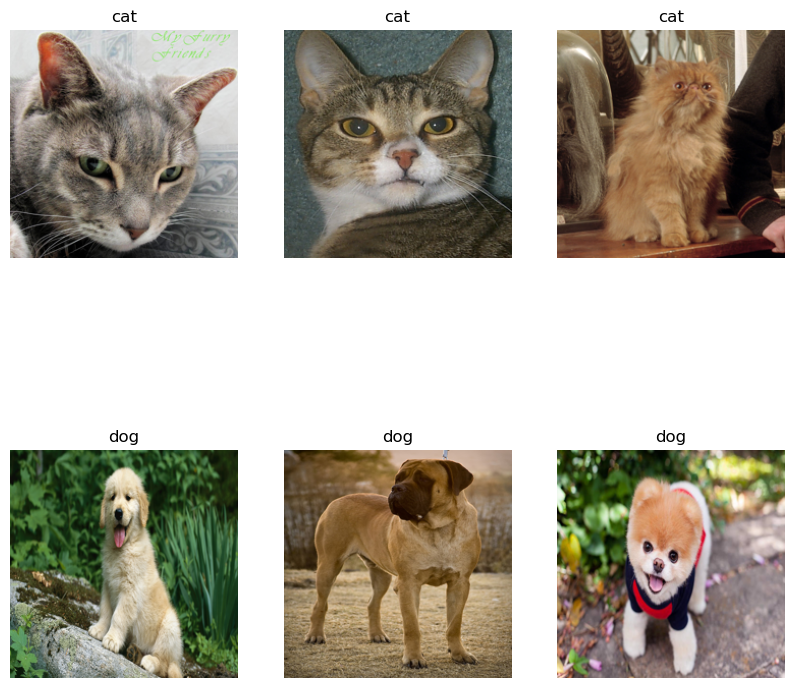

In [16]:
train_images = os.path.join(image_path, "train")

image_size = (image_resize, image_resize)

def display_images(directory):
    plt.figure(figsize=(10, 10))
    categories = os.listdir(directory)
    for category in categories:
        category_dir = os.path.join(directory, category)
        images = [file for file in os.listdir(category_dir) if os.path.isfile(os.path.join(category_dir, file))]
        for i in range(3):
            img_name = random.choice(images)
            img_path = os.path.join(category_dir, img_name)

            img = Image.open(img_path)
            img = img.resize(image_size)

            plt.subplot(2, 3, categories.index(category) * 3 + i + 1)
            plt.imshow(img)
            plt.title(category)
            plt.axis('off')
    plt.show()

display_images(train_images)

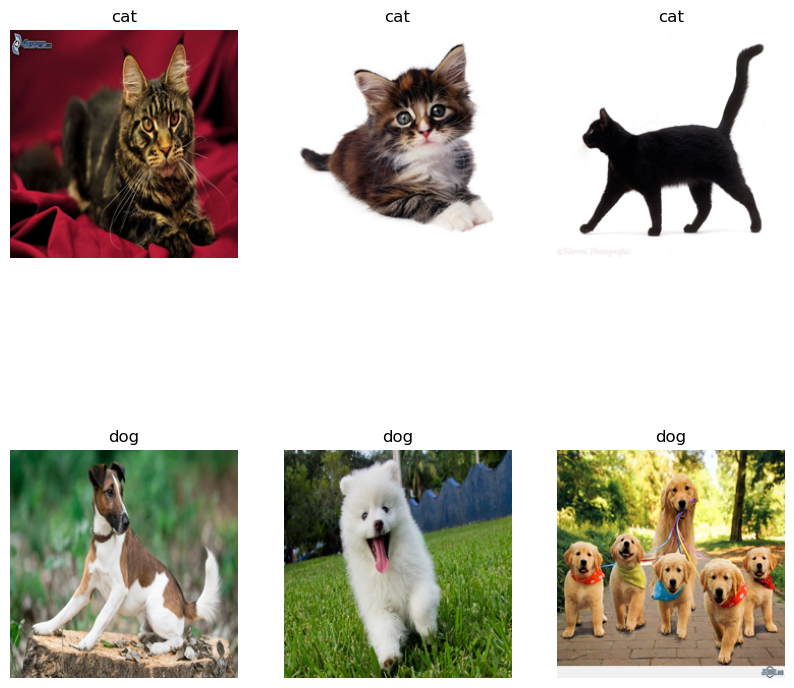

In [18]:
validation_images = os.path.join(image_path, "validation")

image_size = (image_resize, image_resize)

def display_images(directory):
    plt.figure(figsize=(10, 10))
    categories = os.listdir(directory)
    for category in categories:
        category_dir = os.path.join(directory, category)
        images = [file for file in os.listdir(category_dir) if os.path.isfile(os.path.join(category_dir, file))]
        for i in range(3):
            img_name = random.choice(images)
            img_path = os.path.join(category_dir, img_name)

            img = Image.open(img_path)
            img = img.resize(image_size)

            plt.subplot(2, 3, categories.index(category) * 3 + i + 1)
            plt.imshow(img)
            plt.title(category)
            plt.axis('off')
    plt.show()

display_images(validation_images)

# 5. Model Training

## 5.1 MobileNet Model

In [19]:
model = Sequential()

model.add(MobileNet(
    include_top=False,
    pooling='avg',
    weights='imagenet',
    input_shape=input_shape
))

model.add(Dense(128, activation="relu"))
model.add(Dense(num_classes, activation="softmax"))

model.layers[0].trainable = False

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
              )

In [20]:
logdir = os.path.join(current_directory, "logs", experiment_name, run_name)
callback = [EarlyStopping(monitor="val_accuracy", patience=patience, verbose=1, mode="max"),
             ModelCheckpoint(filepath=f"{class_1}_{class_2}_clf_model.h5", monitor="val_accuracy", mode="max", save_best_only=True, save_weights_only=False, verbose=1), 
             keras.callbacks.TensorBoard(log_dir=logdir, write_graph=True, histogram_freq=1)]

## 5.2 Model Summary

In [21]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 1024)              3228864   
 onal)                                                           
                                                                 
 dense (Dense)               (None, 128)               131200    
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 3360322 (12.82 MB)
Trainable params: 131458 (513.51 KB)
Non-trainable params: 3228864 (12.32 MB)
_________________________________________________________________


## 5.3 Model Plots

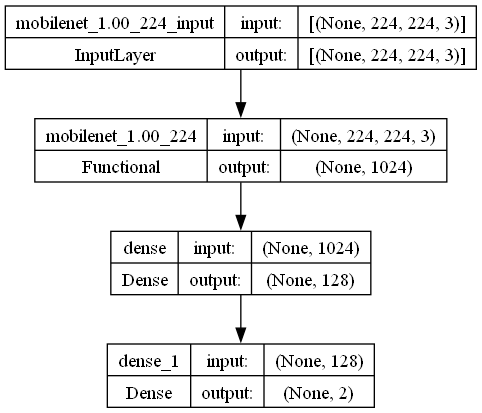

In [22]:
keras.utils.plot_model(model, show_shapes=True)

## 5.4 Model Training

In [23]:
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch_training,
    epochs=num_epochs,
    validation_data=validation_generator,
    validation_steps=steps_per_epoch_validation,
    verbose=1,
    callbacks=callback
)

Epoch 1/30
4/4 [==============================] - ETA: 0s - loss: 6.5396 - accuracy: 0.4976
Epoch 1: val_accuracy improved from -inf to 0.51020, saving model to cat_dog_clf_model.h5


c:\Users\Arda\anaconda3\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4/4 [==============================] - 15s 4s/step - loss: 6.5396 - accuracy: 0.4976 - val_loss: 3.2744 - val_accuracy: 0.5102
Epoch 2/30
4/4 [==============================] - ETA: 0s - loss: 1.8915 - accuracy: 0.4976
Epoch 2: val_accuracy did not improve from 0.51020
4/4 [==============================] - 11s 3s/step - loss: 1.8915 - accuracy: 0.4976 - val_loss: 2.1195 - val_accuracy: 0.4898
Epoch 3/30
4/4 [==============================] - ETA: 0s - loss: 1.3366 - accuracy: 0.4739
Epoch 3: val_accuracy did not improve from 0.51020
4/4 [==============================] - 12s 3s/step - loss: 1.3366 - accuracy: 0.4739 - val_loss: 1.0535 - val_accuracy: 0.5102
Epoch 4/30
4/4 [==============================] - ETA: 0s - loss: 0.6990 - accuracy: 0.5924
Epoch 4: val_accuracy improved from 0.51020 to 0.53061, saving model to cat_dog_clf_model.h5
4/4 [==============================] - 12s 4s/step - loss: 0.6990 - accuracy: 0.5924 - val_loss: 1.0086 - val_accuracy: 0.5306
Epoch 5/30
4/4 [=====

In [24]:
model_file_path = f"{class_1}_{class_2}_clf_model.keras"
model.save(model_file_path)

In [25]:
model = load_model(model_file_path)

In [26]:
mlflow.set_tracking_uri("http://localhost:5000")
mlflow.set_experiment(experiment_name)
with mlflow.start_run(run_name=run_name) as mlflow_run:
    mlflow.set_experiment_tag("base_model", "MobileNet")
    mlflow.set_tag("optimizer", "keras.optimizers.Adam")
    mlflow.set_tag("loss", "categorical_crossentropy")

    mlflow.log_param("learning_rate", learning_rate)
    mlflow.log_param("num_epochs", num_epochs)
    mlflow.log_param("batch_size", batch_size)
    mlflow.log_param("input_shape", input_shape)

    best_val_acc_index = np.argmax(history.history["val_accuracy"])
    mlflow.log_metric("train_loss", history.history["loss"][best_val_acc_index])
    mlflow.log_metric("train_acc", history.history["accuracy"][best_val_acc_index])
    mlflow.log_metric("val_loss", history.history["val_loss"][best_val_acc_index])
    mlflow.log_metric("val_acc", history.history["val_accuracy"][best_val_acc_index])

    mlflow.log_artifact("model.png", "model_plot")

    mlflow.keras.log_model(model, artifact_path="models", registered_model_name="cat_dog_classifier_mobilenet")

    mlflow_run_id = mlflow_run.info.run_id
    print("MLFlow Run ID: ", mlflow_run_id)

2024/04/09 16:24:46 INFO mlflow.tracking.fluent: Experiment with name 'cat_dog_classification_mobilenet' does not exist. Creating a new experiment.
2024/04/09 16:24:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\Arda\AppData\Local\Temp\tmp80j7v7yi\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\Arda\AppData\Local\Temp\tmp80j7v7yi\model\data\model\assets
c:\Users\Arda\anaconda3\Lib\site-packages\_distutils_hack\__init__.py:26: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
Successfully registered model 'cat_dog_classifier_mobilenet'.
2024/04/09 16:25:00 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: cat_dog_classifier_mobilenet, version 1


MLFlow Run ID:  f2aad0db572c489f8381bbae2732147d


Created version '1' of model 'cat_dog_classifier_mobilenet'.


In [28]:
%load_ext tensorboard
%tensorboard --logdir c:/Users/Arda/Desktop/vs_projects/cat_dog_classifier/logs/cat_dog_classification_mobilenet/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 13772), started 3 days, 18:15:17 ago. (Use '!kill 13772' to kill it.)

# 5.5 Model Evaluation

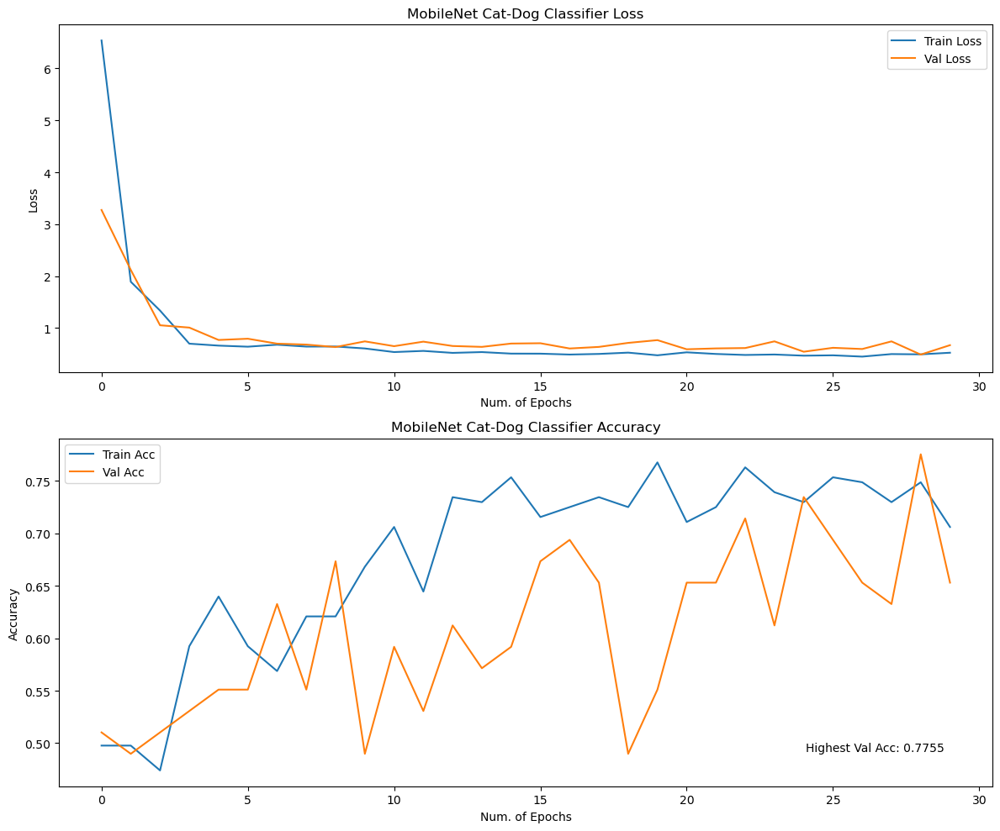

In [29]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

axes[0].plot(history.history['loss'], label='Train Loss')
axes[0].plot(history.history['val_loss'], label='Val Loss')
axes[0].set_title("MobileNet Cat-Dog Classifier Loss")
axes[0].set_xlabel("Num. of Epochs")
axes[0].set_ylabel("Loss")
axes[0].legend()

axes[1].plot(history.history['accuracy'], label='Train Acc')
axes[1].plot(history.history['val_accuracy'], label='Val Acc')
axes[1].set_title("MobileNet Cat-Dog Classifier Accuracy")
axes[1].set_xlabel("Num. of Epochs")
axes[1].set_ylabel("Accuracy")
axes[1].legend()
axes[1].text(0.8, 0.1, f"Highest Val Acc: {max(history.history['val_accuracy']):.4f}", transform=axes[1].transAxes)

plt.tight_layout()

plt.show()

# 6. Prediction

## 6.1 Prediction with the best model

1/1 [==============================] - 0s 43ms/step


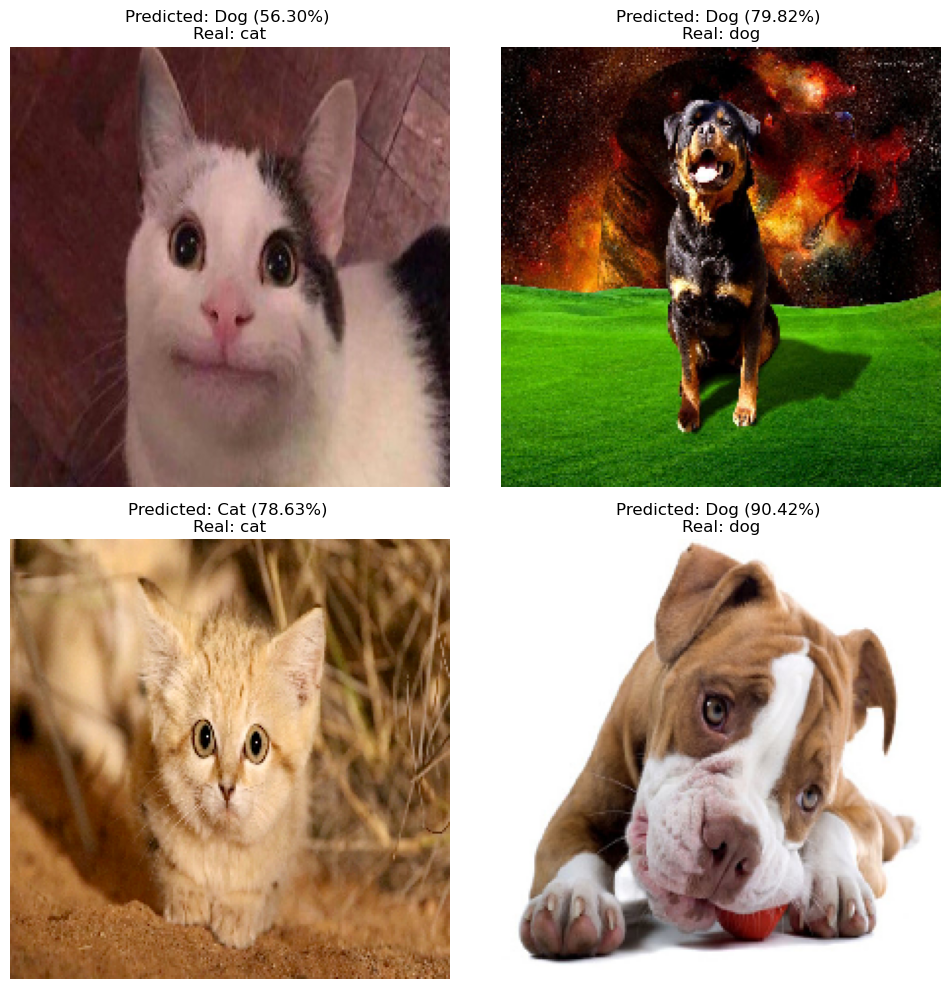

In [33]:
def predict_image_category(image_path, model, input_shape, ax, real_category):
    img = keras.preprocessing.image.load_img(
        image_path, target_size=input_shape
    )
    img_array = keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)
    predicted_category = "Cat" if predictions[0][0] > predictions[0][1] else "Dog"
    ax.set_title("Predicted: {} ({:.2f}%) \nReal: {}".format(
        predicted_category, max(predictions[0])*100, real_category))
    ax.imshow(img)
    ax.axis('off')

def display_images(directory):
    plt.figure(figsize=(10, 10))
    categories = os.listdir(directory)
    for i in range(2):
        for j, category in enumerate(categories, start=1):
            category_dir = os.path.join(directory, category)
            images = [file for file in os.listdir(category_dir) if os.path.isfile(os.path.join(category_dir, file))]
            img_name = random.choice(images)
            img_path = os.path.join(category_dir, img_name)

            img = Image.open(img_path)
            img = img.resize(image_size)

            ax = plt.subplot(2, len(categories), i * len(categories) + j)
            predict_image_category(img_path, model, image_size, ax, category)
    plt.tight_layout()
    plt.show()

validation_images = os.path.join(image_path, "validation")
image_size = (image_resize, image_resize)

display_images(validation_images)

# 7. Load The Model from MLflow

In [ ]:
logged_model = f"runs:/{mlflow_run_id}/models"

model = mlflow.keras.load_model(logged_model)

# 8. Predict with MLflow Model

1/1 [==============================] - 0s 32ms/step


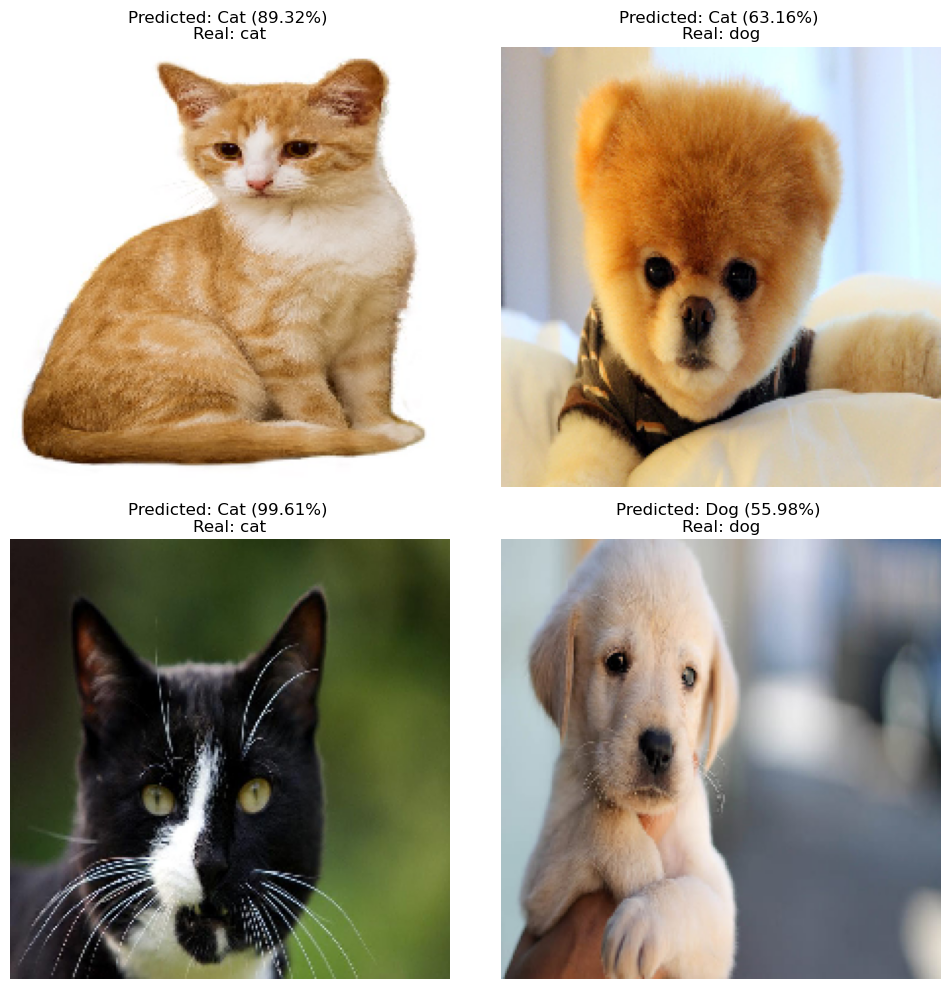

In [38]:
display_images(validation_images)

# 9. Transition of The Model to Production Stage

In [39]:
client = mlflow.tracking.MlflowClient()
client.transition_model_version_stage(
    name="cat_dog_classifier_mobilenet",
    version="1",
    stage="Production"
)

C:\Users\Arda\AppData\Local\Temp\ipykernel_13352\3684993616.py:2: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/2.11.3/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


<ModelVersion: aliases=[], creation_timestamp=1712669100377, current_stage='Production', description='', last_updated_timestamp=1712669243121, name='cat_dog_classifier_mobilenet', run_id='f2aad0db572c489f8381bbae2732147d', run_link='', source='mlflow-artifacts:/707319291941509058/f2aad0db572c489f8381bbae2732147d/artifacts/models', status='READY', status_message='', tags={}, user_id='', version='1'>

# 10. Model Deployment

## 10.1
- Set environment variable for MLFlow URI
`$env:MLFLOW_TRACKING_URI = "http://localhost:5000"`


- Start MLFlow Server for the model
`mlflow models serve --model-uri models:/cat_dog_classifier_mobilenet/production -p 7777 --no-conda`

In [42]:
def predict_image_category(image_path, endpoint, input_shape, ax):
    img = keras.preprocessing.image.load_img(
        image_path, target_size=input_shape
    )
    img_array = keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    image_request = {"instances": img_array.numpy().tolist()}

    response = requests.post(endpoint, json=image_request)
    predictions = eval(response.text)["predictions"]

    predicted_category = "Cat" if predictions[0][0] > predictions[0][1] else "Dog"
    confidence = max(predictions[0]) * 100
    ax.set_title("Predicted: {} ({:.2f}%)".format(predicted_category, confidence))
    ax.imshow(img)
    ax.axis('off')

def display_images_with_predictions_from_directory(directory, endpoint):
    plt.figure(figsize=(10, 10))
    image_files = os.listdir(directory)
    for i, image_file in enumerate(image_files, start=1):
        img_path = os.path.join(directory, image_file)

        img = Image.open(img_path)
        img = img.resize(image_size)

        ax = plt.subplot(2, len(image_files), i)
        predict_image_category(img_path, endpoint, image_size, ax)
    plt.tight_layout()
    plt.show()

In [43]:

image_directory_for_testing = os.path.join(current_directory, "test_images")
image_size = (image_resize, image_resize)
endpoint = "http://localhost:7777/invocations"

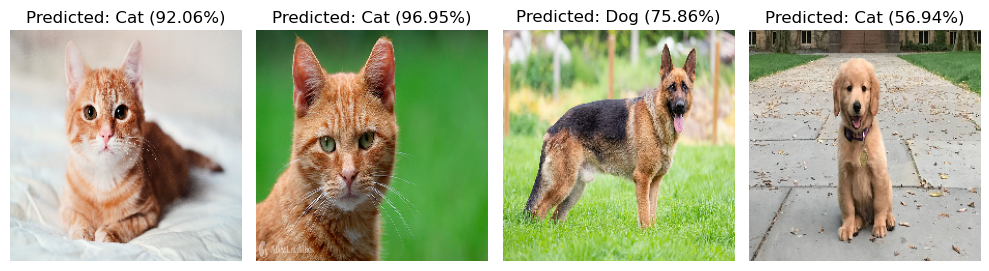

In [44]:
display_images_with_predictions_from_directory(image_directory_for_testing, endpoint)